# FourClass Pipeline Modeling

## Imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Data Manipulation and Visualization Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Image Processing Libraries
from PIL import Image
import cv2
import os
import tarfile

# Data Augmentation
import imgaug.augmenters as iaa

In [ ]:
# Import pretrained models
%%capture
!pip install pretrainedmodels
import pretrainedmodels
from pretrainedmodels import se_resnext50_32x4d

%%capture
!pip install git+https://github.com/qubvel/classification_models.git
from classification_models.tfkeras import Classifiers

In [ ]:
# SSL Configuration
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [ ]:
# TensorFlow and Keras for Model Building
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16, MobileNet, DenseNet121, DenseNet169, DenseNet201, NASNetMobile, InceptionV3
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input, Add, Activation, ZeroPadding2D, AveragePooling2D, Conv2D, Flatten, MaxPooling2D, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras import mixed_precision

In [ ]:
# Set global policy for mixed precision
mixed_precision.set_global_policy('mixed_float16')

In [ ]:
# Scikit-learn for Model Evaluation
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, f1_score, auc, roc_curve, roc_auc_score

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import ResNet101

from tensorflow.keras.metrics import Recall
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.optimizers import RMSprop

In [ ]:
%%capture
!pip install git+https://github.com/qubvel/classification_models.git

In [ ]:
from classification_models.tfkeras import Classifiers

In [ ]:
import numpy as np
from PIL import Image

path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Datasets/four_class_maskeddenoised_data/training_augmented/melanoma/ISIC_9998682.jpg'

In [ ]:
img = np.array(Image.open(path))
print(f"The image dtype is: {img.dtype}")

The image dtype is: uint8


## Model 2 V1 (masked, denoised, balanced data)

### Copying training, validation, test data to disk

In [ ]:
# Copy the training_augmented directory
!cp -r /content/drive/MyDrive/MIDS\ 210A\ -\ Capstone\ Project/Code/Datasets/four_class_maskeddenoised_data/training_augmented /content/

# Copy the validation directory
!cp -r /content/drive/MyDrive/MIDS\ 210A\ -\ Capstone\ Project/Code/Datasets/four_class_maskeddenoised_data/validation /content/

# Copy the test directory
!cp -r /content/drive/MyDrive/MIDS\ 210A\ -\ Capstone\ Project/Code/Datasets/four_class_maskeddenoised_data/test /content/

In [ ]:
# Renamed the directory
train_dir = '/content/training_augmented'
validation_dir = '/content/validation'
test_dir = '/content/test'

### Normalizing images (height, width, channels)

In [ ]:
# Custom normalization function
def normalize_image(image):
    max_pixel_value = np.max(image)  # Get the max pixel value in the image
    if max_pixel_value > 0:  # Avoid division by zero
        image = image / max_pixel_value  # Normalize the image
    return image

In [ ]:
# Modify ImageDataGenerator to use the custom preprocessing function
train_datagen = ImageDataGenerator(preprocessing_function=normalize_image)
validation_datagen = ImageDataGenerator(preprocessing_function=normalize_image)
test_datagen = ImageDataGenerator(preprocessing_function=normalize_image)

### Creating generators for each dataset

In [ ]:
# Load training data from the directory
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

# Load validation data from the directory
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

# Load test data from the directory
test_generator = test_datagen.flow_from_directory(    test_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    shuffle=False
)

Found 24104 images belonging to 4 classes.
Found 3013 images belonging to 4 classes.
Found 3013 images belonging to 4 classes.


In [ ]:
# Convert ImageDataGenerator output to tf.data.Dataset with batch size in shape
def generator_to_tf_dataset(generator):
    return tf.data.Dataset.from_generator(
        lambda: generator,
        output_signature=(
            tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32),  # Include batch dimension (None)
            tf.TensorSpec(shape=(None, 4), dtype=tf.float32)  # Include batch dimension for labels
        )
    )

# Wrap the train, validation, and test generators
train_ds = generator_to_tf_dataset(train_generator)
val_ds = generator_to_tf_dataset(validation_generator)
test_ds = generator_to_tf_dataset(test_generator)

# Prefetch for performance
train_ds = train_ds.prefetch(tf.data.experimental.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.experimental.AUTOTUNE)
test_ds = test_ds.prefetch(tf.data.experimental.AUTOTUNE)

## DenseNet 121

### Model Architecture

In [ ]:
# Load DenseNet121 without the top layers (you can choose 121, 169, or 201)
densenet_base = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze all layers in the base model
for layer in densenet_base.layers:
    layer.trainable = False

# Add custom layers on top of DenseNet
x = densenet_base.output
x = GlobalAveragePooling2D()(x)  # Reduce dimensions
x = BatchNormalization()(x)  # Batch Normalization before fully connected layer
x = Dense(256, activation='relu')(x)  # Fully connected layer
x = Dropout(0.3)(x)  # Dropout to avoid overfitting

# Output layer (adjust for 4 classes or 10 classes based on your project)
predictions = Dense(4, activation='softmax')(x)  # Adjust based on your classification problem

# Create the complete model
model_densenet = Model(inputs=densenet_base.input, outputs=predictions)

# Compile the model
model_densenet.compile(optimizer=RMSprop(learning_rate=0.00005),
                           loss='categorical_crossentropy',
                           metrics=['accuracy'])

# Early stopping callback (monitor val_accuracy) and reducing learning rate
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=10, verbose=1)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


### Model Training

In [ ]:
# Define total training and validation samples and batch size
total_train_samples = 24104  # train dataset size
total_val_samples = 3013     # validation dataset size
total_test_samples = 3013    # test dataset size
batch_size = 64

steps_per_epoch = total_train_samples // batch_size
validation_steps = total_val_samples // batch_size

# Calculate the steps for the test dataset
test_steps = total_test_samples // batch_size

In [ ]:
# Train the model
history = model_densenet.fit(
    train_ds,  # Use the wrapped tf.data.Dataset
    steps_per_epoch=steps_per_epoch,  # Define the steps per epoch
    validation_data=val_ds,  # Use the wrapped validation dataset
    validation_steps=validation_steps,  # Define the validation steps
    epochs=50,  # Number of epochs
    callbacks=[reduce_lr, early_stopping]
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 81s 135ms/step - accuracy: 0.4222 - loss: 1.3289 - val_accuracy: 0.6612 - val_loss: 0.8664 - learning_rate: 5.0000e-05
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 62s 129ms/step - accuracy: 0.5482 - loss: 1.0710 - val_accuracy: 0.6745 - val_loss: 0.8212 - learning_rate: 5.0000e-05
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - accuracy: 0.5730 - loss: 1.0095 - val_accuracy: 0.6748 - val_loss: 0.8134 - learning_rate: 5.0000e-05
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - accuracy: 0.5811 - loss: 0.9854 - val_accuracy: 0.6772 - val_loss: 0.7934 - learning_rate: 5.0000e-05
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.5999 - loss: 0.9520 - val_accuracy: 0.6907 - val_loss: 0.7805 - learning_rate: 5.0000e-05
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - accuracy: 0.5987 - loss: 0.9471 - val_accuracy: 0.6938 - val_loss: 0.7718 - learning_rate: 5.0000e-05
Epoch 7/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms

In [ ]:
# Phase 2: Unfreeze the last set of layers and continue training
for layer in densenet_base.layers[-20:]:  # Unfreezing the last 20 layers
    layer.trainable = True

# Recompile the model (necessary after any change to `trainable` property of any layer)
model_densenet.compile(optimizer=RMSprop(learning_rate=0.00001),  # Lower learning rate for fine-tuning
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Continue training
fine_tune_history = model_densenet.fit(
    train_ds,  # Use the wrapped tf.data.Dataset
    steps_per_epoch=steps_per_epoch,  # Define the steps per epoch
    validation_data=val_ds,  # Use the wrapped validation dataset
    validation_steps=validation_steps,  # Define the validation steps
    epochs=40,  # Number of epochs
    callbacks=[reduce_lr, early_stopping]
)


Epoch 1/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 89s 164ms/step - accuracy: 0.6224 - loss: 0.9104 - val_accuracy: 0.6860 - val_loss: 0.7851 - learning_rate: 1.0000e-05
Epoch 2/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - accuracy: 0.6229 - loss: 0.8998 - val_accuracy: 0.6894 - val_loss: 0.7596 - learning_rate: 1.0000e-05
Epoch 3/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - accuracy: 0.6263 - loss: 0.8908 - val_accuracy: 0.6985 - val_loss: 0.7692 - learning_rate: 1.0000e-05
Epoch 4/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.6314 - loss: 0.8924 - val_accuracy: 0.6975 - val_loss: 0.7479 - learning_rate: 1.0000e-05
Epoch 5/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - accuracy: 0.6312 - loss: 0.8803 - val_accuracy: 0.7023 - val_loss: 0.7511 - learning_rate: 1.0000e-05
Epoch 6/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.6364 - loss: 0.8794 - val_accuracy: 0.6897 - val_loss: 0.7735 - learning_rate: 1.0000e-05
Epoch 7/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 37s 100m

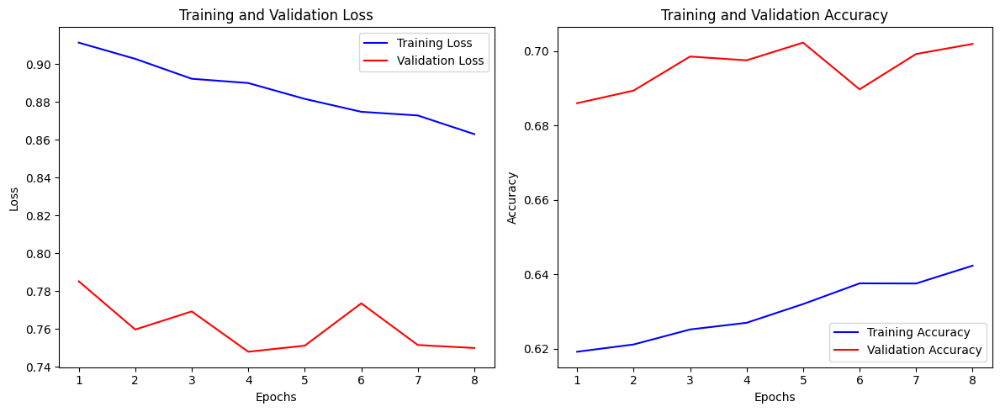

In [ ]:
# Assuming 'history' is the returned object from model_mobilenet.fit
history_dict = fine_tune_history.history

# Extract loss and accuracy for both training and validation
train_loss = history_dict['loss']
val_loss = history_dict['val_loss']
train_accuracy = history_dict['accuracy']
val_accuracy = history_dict['val_accuracy']

# Create a figure with two subplots: one for loss and one for accuracy
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(12, 5))

# Plot the loss values
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot the accuracy values
plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracy, 'b', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Evaluate the model on the test data
test_loss, test_acc = model_densenet.evaluate(test_generator)
print(f"Test Accuracy: {test_acc * 100:.2f}%")

 1/48 ━━━━━━━━━━━━━━━━━━━━ 6s 144ms/step - accuracy: 0.3750 - loss: 1.2961

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - accuracy: 0.6125 - loss: 0.9174
Test Accuracy: 70.83%


### Saving Model

In [ ]:
# Define the path where you want to save your model in Google Drive
save_path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass'

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Save your senet154_v3 model in .h5 format
model_densenet.save(os.path.join(save_path, "densenet121_v1.h5"))

# Optionally create a tar.gz archive for portability
with tarfile.open(os.path.join(save_path, "densenet121_v1.tar.gz"), mode="w:gz") as archive:
    archive.add(os.path.join(save_path, "densenet121_v1.h5"), arcname="densenet121_v1.h5")

print(f"Model saved to: {save_path}")

Model saved to: /content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass


### Loading Model

In [ ]:
# Define the path to your saved SENet154_v3 model
model_path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass/densenet121_v1.h5'

# Load the senet154_v3 model
model = tf.keras.models.load_model(model_path)

# Display the model summary to verify it loaded correctl
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,305,034 (27.87 MB)

 Trainable params: 632,644 (2.41 MB)

 Non-trainable params: 6,672,384 (25.45 MB)

 Optimizer params: 6 (36.00 B)

### Evaluating Model

#### Printing Metrics

In [ ]:
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)  # Get the predicted class indices
y_true = test_generator.classes  # True labels from the generator

48/48 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step


In [ ]:
print(f"Precision: {precision_score(y_true, y_pred, average='weighted')}")
print(f"Recall: {recall_score(y_true, y_pred, average='weighted')}")
print(f"F1 Score: {f1_score(y_true, y_pred, average='weighted')}")
print(f"Accuracy: {accuracy_score(y_true, y_pred)}")
# print(f"AUC: {roc_auc_score(y_true, y_pred)}")

Precision: 0.7317649731021484
Recall: 0.7082641885164288
F1 Score: 0.7151225386230241
Accuracy: 0.7082641885164288


#### Displaying Confusion Matrix

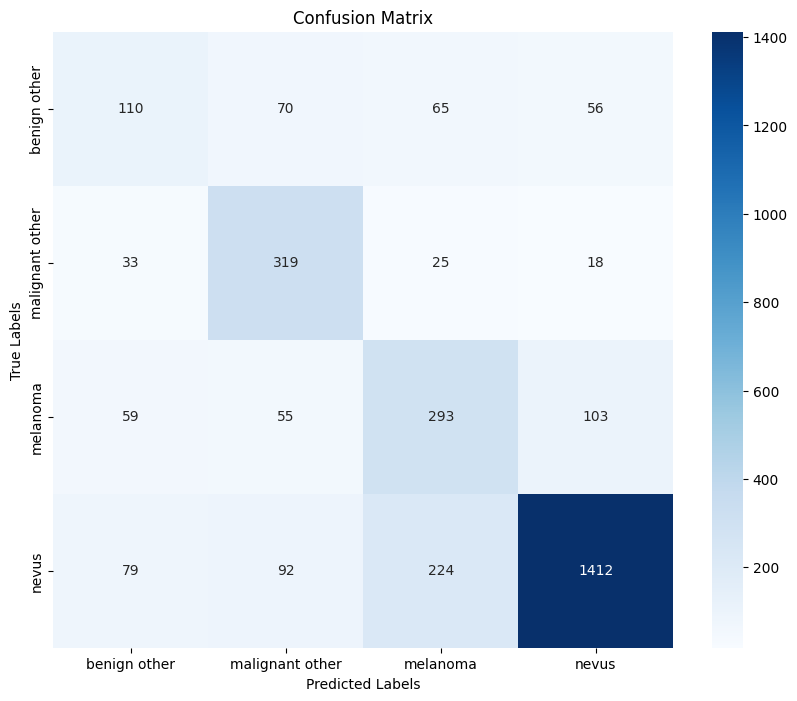

In [ ]:
# Get the class names from the test generator (adjust this based on your test generator)
class_names = list(test_generator.class_indices.keys())

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

#### Displaying ROC Curve

## DenseNet 121 V2

### Model Architecture

In [ ]:
# Load DenseNet121 without the top layers (you can choose 121, 169, or 201)
densenet_base = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of DenseNet
x = densenet_base.output
x = GlobalAveragePooling2D()(x)  # Reduce dimensions
x = Dense(256, activation='relu')(x)  # Fully connected layer
x = Dropout(0.3)(x)  # Dropout to avoid overfitting

# Output layer (adjust for 4 classes or 10 classes based on your project)
predictions = Dense(4, activation='softmax')(x)  # Adjust based on your classification problem

# Create the complete model
model_densenet_v2 = Model(inputs=densenet_base.input, outputs=predictions)

# Unfreeze 20 layers
for layer in densenet_base.layers[:-20]:  # Unfreeze the last 20 layers
    layer.trainable = True

# Compile the model
model_densenet_v2.compile(optimizer=RMSprop(learning_rate=0.00005),
                           loss='categorical_crossentropy',
                           metrics=['accuracy'])

# Early stopping callback (monitor val_accuracy) and reducing learning rate
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=10, verbose=1)

### Model Training

In [ ]:
# Define total training and validation samples and batch size
total_train_samples = 24104  # train dataset size
total_val_samples = 3013     # validation dataset size
total_test_samples = 3013    # test dataset size
batch_size = 64

steps_per_epoch = total_train_samples // batch_size
validation_steps = total_val_samples // batch_size

# Calculate the steps for the test dataset
test_steps = total_test_samples // batch_size

In [ ]:
# Train the model
history = model_densenet_v2.fit(
    train_ds,  # Use the wrapped tf.data.Dataset
    steps_per_epoch=steps_per_epoch,  # Define the steps per epoch
    validation_data=val_ds,  # Use the wrapped validation dataset
    validation_steps=validation_steps,  # Define the validation steps
    epochs=40,  # Number of epochs
    callbacks=[reduce_lr, early_stopping]
)

# Evaluate the model on the test data
test_loss, test_acc = model_densenet_v2.evaluate(test_ds, steps=test_steps)
print(f"Test Accuracy: {test_acc * 100:.2f}%")

Epoch 1/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 275s 365ms/step - accuracy: 0.5178 - loss: 1.1339 - val_accuracy: 0.6931 - val_loss: 0.7289 - learning_rate: 5.0000e-05
Epoch 2/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.6628 - loss: 0.8182 - val_accuracy: 0.7277 - val_loss: 0.6799 - learning_rate: 5.0000e-05
Epoch 3/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.7351 - loss: 0.6579 - val_accuracy: 0.7091 - val_loss: 0.7718 - learning_rate: 5.0000e-05
Epoch 4/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.7889 - loss: 0.5406 - val_accuracy: 0.7067 - val_loss: 0.7733 - learning_rate: 5.0000e-05
Epoch 5/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - accuracy: 0.8508 - loss: 0.4001 - val_accuracy: 0.7430 - val_loss: 0.7781 - learning_rate: 5.0000e-05
Epoch 6/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - accuracy: 0.8900 - loss: 0.2902 - val_accuracy: 0.6985 - val_loss: 1.1544 - learning_rate: 5.0000e-05
Epoch 7/40
376/376 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms

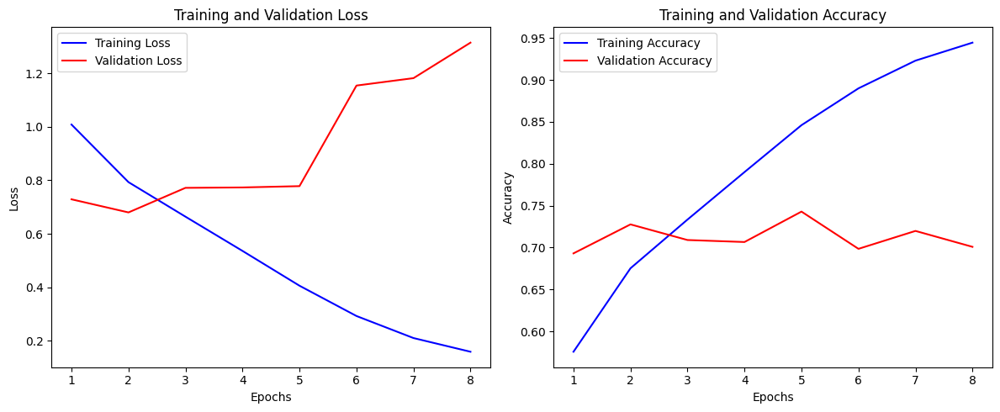

In [ ]:
# Assuming 'history' is the returned object from model_mobilenet.fit
history_dict = history.history

# Extract loss and accuracy for both training and validation
train_loss = history_dict['loss']
val_loss = history_dict['val_loss']
train_accuracy = history_dict['accuracy']
val_accuracy = history_dict['val_accuracy']

# Create a figure with two subplots: one for loss and one for accuracy
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(12, 5))

# Plot the loss values
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot the accuracy values
plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracy, 'b', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

### Saving Model

In [ ]:
# Define the path where you want to save your model in Google Drive
save_path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass'

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Save your senet154_v3 model in .h5 format
model_densenet.save(os.path.join(save_path, "densenet121_v2.h5"))

# Optionally create a tar.gz archive for portability
with tarfile.open(os.path.join(save_path, "densenet121_v2.tar.gz"), mode="w:gz") as archive:
    archive.add(os.path.join(save_path, "densenet121_v2.h5"), arcname="densenet121_v2.h5")

print(f"Model saved to: {save_path}")

Model saved to: /content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass


### Loading Model

In [ ]:
# Define the path to your saved SENet154_v3 model
model_path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass/densenet121_v2.h5'

# Load the senet154_v3 model
model = tf.keras.models.load_model(model_path)

# Display the model summary to verify it loaded correctl
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,305,034 (27.87 MB)

 Trainable params: 632,644 (2.41 MB)

 Non-trainable params: 6,672,384 (25.45 MB)

 Optimizer params: 6 (36.00 B)

### Evaluating Model

#### Printing Metrics

In [ ]:
predictions = model_densenet_v2.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)  # Get the predicted class indices
y_true = test_generator.classes  # True labels from the generator

48/48 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step


In [ ]:
print(f"Precision: {precision_score(y_true, y_pred, average='weighted')}")
print(f"Recall: {recall_score(y_true, y_pred, average='weighted')}")
print(f"F1 Score: {f1_score(y_true, y_pred, average='weighted')}")
print(f"Accuracy: {accuracy_score(y_true, y_pred)}")
# print(f"AUC: {roc_auc_score(y_true, y_pred)}")

Precision: 0.7738678913710383
Recall: 0.7504148689014272
F1 Score: 0.7571847347352744
Accuracy: 0.7504148689014272


#### Displaying Confusion Matrix

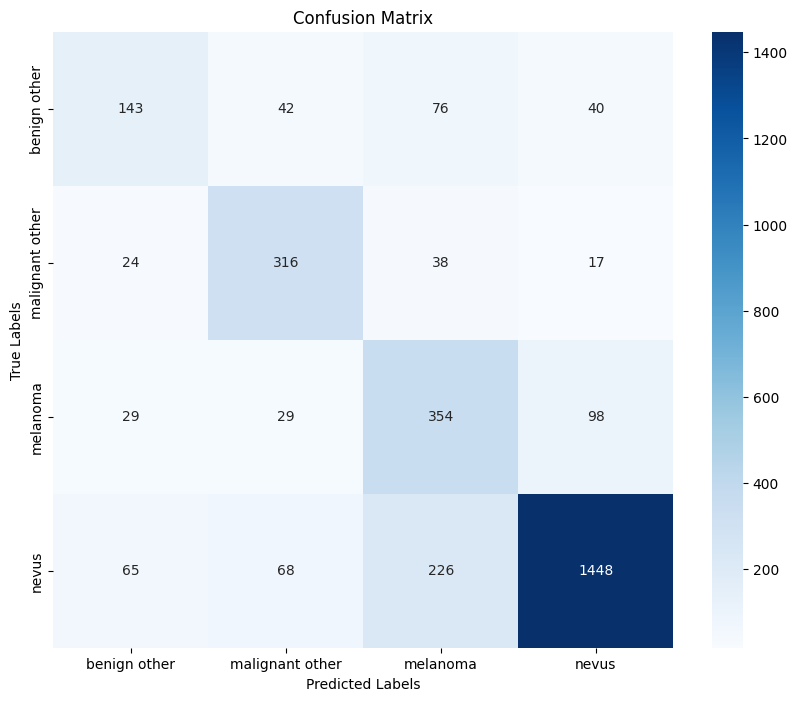

In [ ]:
# Get the class names from the test generator (adjust this based on your test generator)
class_names = list(test_generator.class_indices.keys())

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

#### Displaying ROC Curve

## DenseNet 121 V3

### Model Architecture

In [ ]:
# Load DenseNet121 without the top layers (you can choose 121, 169, or 201)
densenet_base = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Initially freeze all layers in the base model
for layer in densenet_base.layers:
    layer.trainable = False

# Unfreeze the last 20 layers for fine-tuning
for layer in densenet_base.layers[-20:]:
    layer.trainable = True

# Add custom layers on top of DenseNet
x = densenet_base.output
x = GlobalAveragePooling2D()(x)  # Reduce dimensions
x = Dense(256, activation='relu')(x)  # Fully connected layer
x = Dropout(0.3)(x)  # Dropout to avoid overfitting

# Output layer (adjust for 4 classes or 10 classes based on your project)
predictions = Dense(4, activation='softmax')(x)  # Adjust based on your classification problem

# Create the complete model
model_densenet_v3 = Model(inputs=densenet_base.input, outputs=predictions)

# Compile the model
model_densenet_v3.compile(optimizer=RMSprop(learning_rate=0.00005),
                           loss='categorical_crossentropy',
                           metrics=['accuracy'])

# Early stopping callback (monitor val_accuracy) and reducing learning rate
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=10, verbose=1)

### Model Training

In [ ]:
# Define total training and validation samples and batch size
total_train_samples = 24104  # train dataset size
total_val_samples = 3013     # validation dataset size
total_test_samples = 3013    # test dataset size
batch_size = 64

steps_per_epoch = total_train_samples // batch_size
validation_steps = total_val_samples // batch_size

# Calculate the steps for the test dataset
test_steps = total_test_samples // batch_size

In [ ]:
# Train the model
history = model_densenet_v3.fit(
    train_ds,  # Use the wrapped tf.data.Dataset
    steps_per_epoch=steps_per_epoch,  # Define the steps per epoch
    validation_data=val_ds,  # Use the wrapped validation dataset
    validation_steps=validation_steps,  # Define the validation steps
    epochs=50,  # Number of epochs
    callbacks=[reduce_lr, early_stopping]
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 88s 162ms/step - accuracy: 0.4226 - loss: 1.3050 - val_accuracy: 0.6775 - val_loss: 0.8470 - learning_rate: 5.0000e-05
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.5717 - loss: 0.9993 - val_accuracy: 0.6975 - val_loss: 0.7781 - learning_rate: 5.0000e-05
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.6039 - loss: 0.9414 - val_accuracy: 0.6972 - val_loss: 0.7692 - learning_rate: 5.0000e-05
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - accuracy: 0.6275 - loss: 0.8861 - val_accuracy: 0.6809 - val_loss: 0.7872 - learning_rate: 5.0000e-05
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - accuracy: 0.6408 - loss: 0.8587 - val_accuracy: 0.7030 - val_loss: 0.7273 - learning_rate: 5.0000e-05
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - accuracy: 0.6512 - loss: 0.8352 - val_accuracy: 0.6941 - val_loss: 0.7597 - learning_rate: 5.0000e-05
Epoch 7/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms

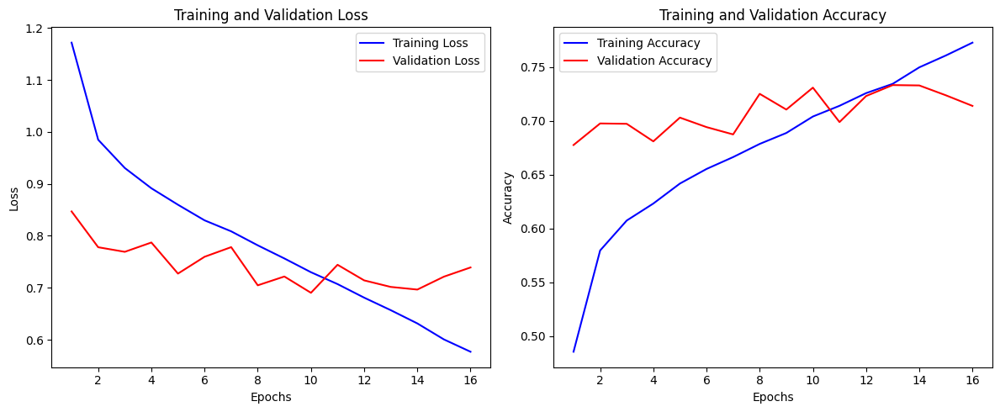

In [ ]:
# Assuming 'history' is the returned object from model_mobilenet.fit
history_dict = history.history

# Extract loss and accuracy for both training and validation
train_loss = history_dict['loss']
val_loss = history_dict['val_loss']
train_accuracy = history_dict['accuracy']
val_accuracy = history_dict['val_accuracy']

# Create a figure with two subplots: one for loss and one for accuracy
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(12, 5))

# Plot the loss values
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot the accuracy values
plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracy, 'b', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Evaluate the model on the test data
test_loss, test_acc = model_densenet_v3.evaluate(test_generator)
print(f"Test Accuracy: {test_acc * 100:.2f}%")

48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - accuracy: 0.6492 - loss: 0.8520
Test Accuracy: 73.58%


### Saving Model

In [ ]:
# Define the path where you want to save your model in Google Drive
save_path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass'

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Save your senet154_v3 model in .h5 format
model_densenet.save(os.path.join(save_path, "densenet121_v3.h5"))

# Optionally create a tar.gz archive for portability
with tarfile.open(os.path.join(save_path, "densenet121_v3.tar.gz"), mode="w:gz") as archive:
    archive.add(os.path.join(save_path, "densenet121_v3.h5"), arcname="densenet121_v3.h5")

print(f"Model saved to: {save_path}")

Model saved to: /content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass


### Loading Model

In [ ]:
# Define the path to your saved SENet154_v3 model
model_path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass/densenet121_v3.h5'

# Load the senet154_v3 model
model = tf.keras.models.load_model(model_path)

# Display the model summary to verify it loaded correctl
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,305,034 (27.87 MB)

 Trainable params: 632,644 (2.41 MB)

 Non-trainable params: 6,672,384 (25.45 MB)

 Optimizer params: 6 (36.00 B)

### Evaluating Model

#### Printing Metrics

In [ ]:
predictions = model_densenet_v3.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)  # Get the predicted class indices
y_true = test_generator.classes  # True labels from the generator

48/48 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step


In [ ]:
print(f"Precision: {precision_score(y_true, y_pred, average='weighted')}")
print(f"Recall: {recall_score(y_true, y_pred, average='weighted')}")
print(f"F1 Score: {f1_score(y_true, y_pred, average='weighted')}")
print(f"Accuracy: {accuracy_score(y_true, y_pred)}")
# print(f"AUC: {roc_auc_score(y_true, y_pred)}")

Precision: 0.7453745776878965
Recall: 0.7358114835711915
F1 Score: 0.7384503571582327
Accuracy: 0.7358114835711915


#### Displaying Confusion Matrix

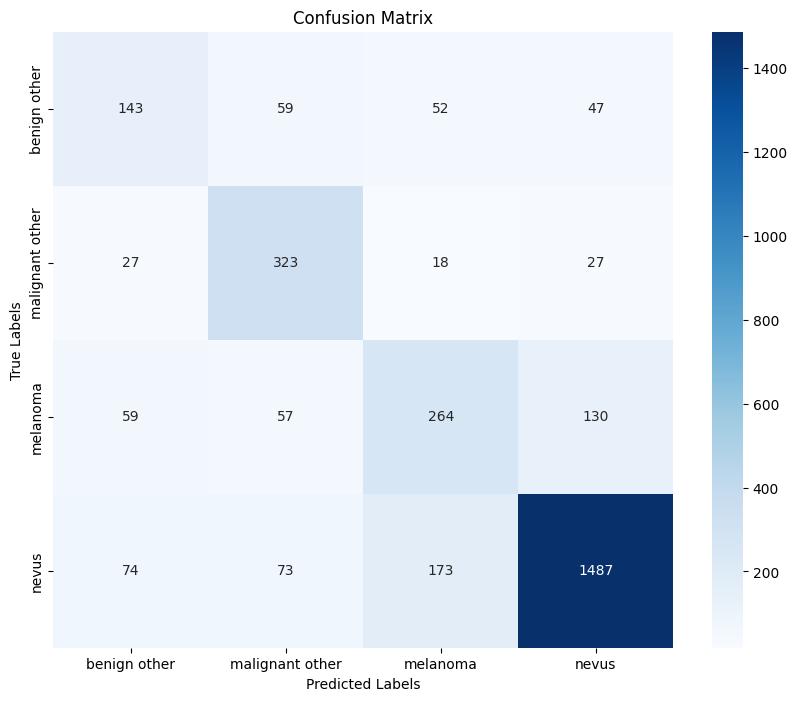

In [ ]:
# Get the class names from the test generator (adjust this based on your test generator)
class_names = list(test_generator.class_indices.keys())

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

#### Displaying ROC Curve

### Transfer Learning SENet 154 v3

This uses https://github.com/qubvel/classification_models, a library that has converted certain pytorch models to tensorflow

#### Model architecture

In [ ]:
senet_base = Classifiers.get('senet154')[0](weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of SENet154
x = GlobalAveragePooling2D()(senet_base.output)
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)  # Add batch normalization
x = Dropout(0.25)(x)  # Reduce dropout to 0.25
predictions = Dense(4, activation='softmax')(x)  # 4 class output

# Create the complete model and name it model_senet154_v3
model_senet154_v3 = Model(inputs=senet_base.input, outputs=predictions)

# Unfreeze more layers for fine-tuning
for layer in senet_base.layers[:-30]:  # Unfreeze the last 30 layers
    layer.trainable = False

for layer in senet_base.layers[-30:]:
    layer.trainable = True

# Compile the model with RMSprop optimizer and a lower learning rate
model_senet154_v3.compile(optimizer=RMSprop(learning_rate=3e-6),  # Lower learning rate
                          loss='categorical_crossentropy',
                          metrics=['accuracy'])

# Callbacks: Early stopping and learning rate reduction
early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1, patience=3, verbose=1)

466635528/466635528 ━━━━━━━━━━━━━━━━━━━━ 9s 0us/step


#### Model training

In [ ]:
# Define total training and validation samples and batch size
total_train_samples = 24104  # train dataset size
total_val_samples = 3013     # validation dataset size
total_test_samples = 3013    # test dataset size
batch_size = 64

steps_per_epoch = total_train_samples // batch_size
validation_steps = total_val_samples // batch_size

# Calculate the steps for the test dataset
test_steps = total_test_samples // batch_size

In [ ]:
# Train the model
history = model_senet154_v3.fit(
    train_ds,  # Use the wrapped tf.data.Dataset
    steps_per_epoch=steps_per_epoch,  # Define the steps per epoch
    validation_data=val_ds,  # Use the wrapped validation dataset
    validation_steps=validation_steps,  # Define the validation steps
    epochs=50,  # Increase number of epochs
    callbacks=[reduce_lr, early_stopping]
)

Epoch 1/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 446s 639ms/step - accuracy: 0.3047 - loss: 1.8537 - val_accuracy: 0.6026 - val_loss: 1.0139 - learning_rate: 3.0000e-06
Epoch 2/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 74s 198ms/step - accuracy: 0.4442 - loss: 1.4169 - val_accuracy: 0.6287 - val_loss: 0.9447 - learning_rate: 3.0000e-06
Epoch 3/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 76s 203ms/step - accuracy: 0.4926 - loss: 1.2784 - val_accuracy: 0.6460 - val_loss: 0.9192 - learning_rate: 3.0000e-06
Epoch 4/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 75s 199ms/step - accuracy: 0.5147 - loss: 1.2365 - val_accuracy: 0.6538 - val_loss: 0.8783 - learning_rate: 3.0000e-06
Epoch 5/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 76s 202ms/step - accuracy: 0.5281 - loss: 1.1832 - val_accuracy: 0.6555 - val_loss: 0.8737 - learning_rate: 3.0000e-06
Epoch 6/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 74s 198ms/step - accuracy: 0.5405 - loss: 1.1361 - val_accuracy: 0.6633 - val_loss: 0.8582 - learning_rate: 3.0000e-06
Epoch 7/50
376/376 ━━━━━━━━━━━━━━━━━━━━ 75s 2

In [ ]:
# Extract loss and accuracy for both training and validation
history_dict = history.history
train_loss = history_dict['loss']
val_loss = history_dict['val_loss']
train_accuracy = history_dict['accuracy']
val_accuracy = history_dict['val_accuracy']

# Create a figure with two subplots: one for loss and one for accuracy
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(12, 5))

# Plot the loss values
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot the accuracy values
plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracy, 'b', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Evaluate the model on the test data
test_loss, test_acc = model_senet154_v3.evaluate(test_generator)
print(f"Test Accuracy: {test_acc * 100:.2f}%")

#### Saving model as senet154_v2

https://github.com/qubvel/classification_models/blob/a0f006e05485a34ccf871c421279864b0ccd220b/classification_models/models/_common_blocks.py#L5 - Slice tensor

In [ ]:
# Register the custom expand_dims function
@tf.keras.utils.register_keras_serializable()
def expand_dims(x, channels_axis):
    if channels_axis == 3:
        return x[:, None, None, :]
    elif channels_axis == 1:
        x = layers.Lambda(expand_dims, arguments={'channels_axis': channels_axis})(x)

In [ ]:
# Define slice_tensor function
def slice_tensor(x, start, stop, axis):
    if axis == 3:
        return x[:, :, :, start:stop]
    elif axis == 1:
        return x[:, start:stop, :, :]
    else:
        raise ValueError("Slice axis should be in (1, 3), got {}.".format(axis))

In [ ]:
# Define the path where you want to save your model in Google Drive
save_path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass'

# Create the directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Save your senet154_v3 model in .h5 format
model_senet154_v3.save(os.path.join(save_path, "senet154_v3.h5"))

# Optionally create a tar.gz archive for portability
with tarfile.open(os.path.join(save_path, "senet154_v3.tar.gz"), mode="w:gz") as archive:
    archive.add(os.path.join(save_path, "senet154_v3.h5"), arcname="senet154_v3.h5")

print(f"Model saved to: {save_path}")

Model saved to: /content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass


#### Loading model

In [ ]:
# Define the path to your saved SENet154_v3 model
model_path = '/content/drive/MyDrive/MIDS 210A - Capstone Project/Code/Modeling/Models/FourClass/senet154_v3.h5'

# Load the senet154_v3 model
model = tf.keras.models.load_model(model_path, custom_objects={'slice_tensor': slice_tensor, 'expand_dims': expand_dims})

# Display the model summary to verify it loaded correctl
model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)        │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 226, 226, 3)    │              0 │ input[0][0]            │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 112, 112, 64)   │          1,728 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 112, 112, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 112, 112, 64)   │              0 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ activation[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 112, 112, 64)   │         36,864 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_6     │ (None, 112, 112, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 112, 112, 64)   │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_2          │ (None, 114, 114, 64)   │              0 │ activation_1[0][0]     │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 112, 112, 128)  │         73,728 │ zero_padding2d_2[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7     │ (None, 112, 112, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 112, 112, 128)  │              0 │ batch_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_3          │ (None, 114, 114, 128)  │              0 │ activation_2[0][0]     │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 56, 56, 128)    │              0 │ zero_padding2d_3[0][0] │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)    

 Total params: 113,814,138 (434.17 MB)

 Trainable params: 5,328,772 (20.33 MB)

 Non-trainable params: 108,485,360 (413.84 MB)

 Optimizer params: 6 (36.00 B)

#### Evaluating model

##### Printing metrics

In [ ]:
model = model_senet154_v3

In [ ]:
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)  # Get the predicted class indices
y_true = test_generator.classes  # True labels from the generator

48/48 ━━━━━━━━━━━━━━━━━━━━ 145s 2s/step


In [ ]:
print(f"Precision: {precision_score(y_true, y_pred, average='weighted')}")
print(f"Recall: {recall_score(y_true, y_pred, average='weighted')}")
print(f"F1 Score: {f1_score(y_true, y_pred, average='weighted')}")
print(f"Accuracy: {accuracy_score(y_true, y_pred)}")
# print(f"AUC: {roc_auc_score(y_true, y_pred)}")

Precision: 0.70973360436243
Recall: 0.6886823763690674
F1 Score: 0.6965181889875555
Accuracy: 0.6886823763690674


##### Displaying confusion matrix

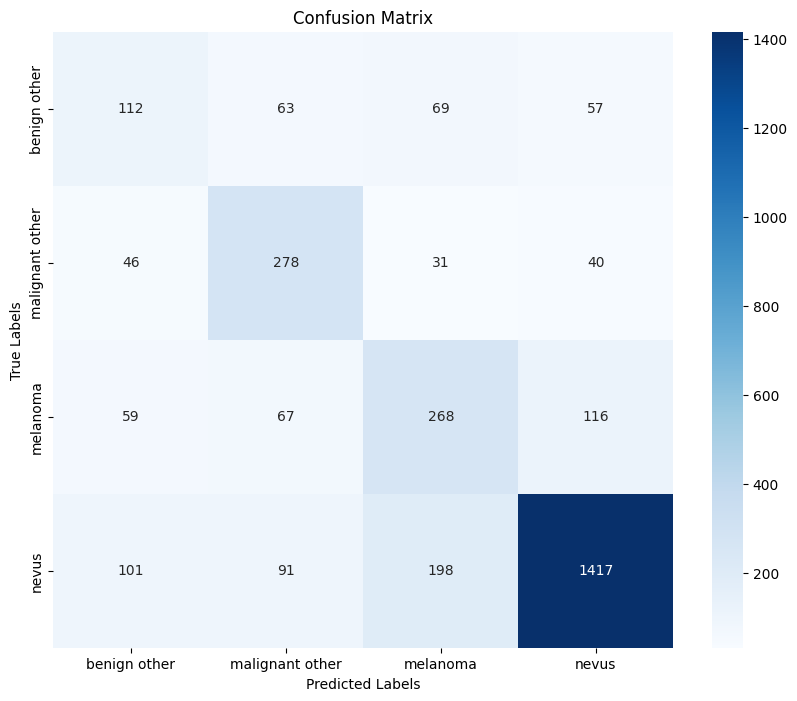

In [ ]:
# Get the class names from the test generator (adjust this based on your test generator)
class_names = list(test_generator.class_indices.keys())

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

i want to see what happens if we now make benign_other + nevus = benign and malig_other + melanoma = malignant

Precision: 0.6046948356807512
Recall: 0.7116022099447514
F1 Score: 0.6538071065989848
Accuracy: 0.7736475273813475


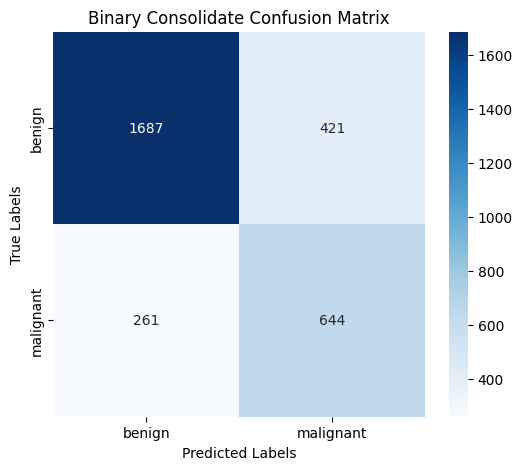

In [ ]:
# Map original class indices to binary classes
# Adjust these mappings based on the actual class indices in test_generator.class_indices
# - "benign other" is 0
# - "malignant other" is 1
# - "melanoma" is 2
# - "nevus" is 3
benign_classes = [0, 3]  # Classes that should be mapped to "benign"
malignant_classes = [1, 2]  # Classes that should be mapped to "malignant"

# Map y_true and y_pred to binary classes
y_true_binary = np.where(np.isin(y_true, benign_classes), 0, 1)
y_pred_binary = np.where(np.isin(y_pred, benign_classes), 0, 1)

# Print metrics for the binary classification
print(f"Precision: {precision_score(y_true_binary, y_pred_binary)}")
print(f"Recall: {recall_score(y_true_binary, y_pred_binary)}")
print(f"F1 Score: {f1_score(y_true_binary, y_pred_binary)}")
print(f"Accuracy: {accuracy_score(y_true_binary, y_pred_binary)}")

# Generate the binary confusion matrix
conf_matrix_binary = confusion_matrix(y_true_binary, y_pred_binary)

# Plot the binary confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_binary, annot=True, fmt="d", cmap="Blues",
            xticklabels=["benign", "malignant"], yticklabels=["benign", "malignant"])
plt.title('Binary Consolidate Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

Four-Class

Precision: 0.70973360436243

Recall: 0.6886823763690674

F1 Score: 0.6965181889875555

Accuracy: 0.6886823763690674

--------

Binary (From Earlier):

Precision: 0.562874251497006

Recall: 0.6225165562913907

F1 Score: 0.5911949685534591

Accuracy: 0.7806524184476941

AUC: 0.7286167687117332

--------

Binary Consolidation:

Precision: 0.6046948356807512

Recall: 0.7116022099447514

F1 Score: 0.6538071065989848

Accuracy: 0.7736475273813475

We were talking earlier about evaluation + integration w/ the binary model.

I tried post-prediction consolidation of classes, expecting this to be helpful for evaluation. However...



the results of this are actually pretty interesting for the binary vs binary consolidation

while the accuracy stays the same, we get an increase in almost all other metrics

I think the gain in recall is particularly good

this is also without any further tuning of our model (used exact same params as earlier pipeline for this)

I wonder why the results are better? I feel like the difference in some metrics (mainly recall and f1 score) are pretty notable -- have not done a stats test or anything, but I doubt it is simply chance in how the data was split

If increases like this are consistent across the different transfer learning models, I feel like we may be able to replace our binary model from earlier with this sort of consolidation.

Again, accuracy stays around the same -- so we may not get an increase in accuracy for a new ensemble (idk). Our ensemble also kind of heavily increased our other metrics. Maybe this won't change anything?

However, this is easy to build, as we follow our 4class process as planned